In [1]:
import torch
from pytorch_pretrained_biggan import (BigGAN, one_hot_from_names, truncated_noise_sample,convert_to_images,
                                       save_as_images, display_in_terminal)
from torchvision.io import read_image
import numpy as np
import matplotlib as plt
import torch.nn as nn
# OPTIONAL: if you want to have more information on what's happening, activate the logger as follows
import logging
logging.basicConfig(level=logging.INFO)

In [31]:
ITERATIONS = 30
USE_REGULARIZATION = True

# Load pre-trained model tokenizer (vocabulary)
GAN_model = BigGAN.from_pretrained('biggan-deep-256')

INFO:pytorch_pretrained_biggan.model:loading model biggan-deep-256 from cache at /Users/roni/.pytorch_pretrained_biggan/e7d036ee69a83e83503c46902552573b27d856eaf6b8b84252a63a715dce7501.aec5caf3e5c5252b8857d6bb8adefa8d1d6092a8ba6c9aaed1e6678f8a46be43
INFO:pytorch_pretrained_biggan.model:Model config {
  "attention_layer_position": 8,
  "channel_width": 128,
  "class_embed_dim": 128,
  "eps": 0.0001,
  "layers": [
    [
      false,
      16,
      16
    ],
    [
      true,
      16,
      16
    ],
    [
      false,
      16,
      16
    ],
    [
      true,
      16,
      8
    ],
    [
      false,
      8,
      8
    ],
    [
      true,
      8,
      8
    ],
    [
      false,
      8,
      8
    ],
    [
      true,
      8,
      4
    ],
    [
      false,
      4,
      4
    ],
    [
      true,
      4,
      2
    ],
    [
      false,
      2,
      2
    ],
    [
      true,
      2,
      1
    ]
  ],
  "n_stats": 51,
  "num_classes": 1000,
  "output_dim": 256,
  

In [6]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /Users/roni/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Current

In [32]:
reg_term_for_img = ""

### Class Containing Both Models ###
class MyEnsemble(torch.nn.Module):
    def __init__(self, GAN, classifier, preprocess, with_nv_loss):
        super(MyEnsemble, self).__init__()
        self.GAN = GAN
        self.classifier = classifier
        self.preprocess = preprocess
        self.iter = 0
        self.with_nv_loss = with_nv_loss

    def adjust(self, output):
        save_as_images(output, file_name='output_'+reg_term+'_'+self.with_nv_loss+'_'+classes+'_'+str(self.iter))
        self.iter = self.iter + 1
        img0 = output
        return img0

    def forward(self, noise, img_class, truncation, save=True):
        output = self.GAN(noise, img_class, truncation)
        if save:
          output = self.adjust(output)
        prediction = self.classifier(output).squeeze(0).softmax(0)
        return prediction +0

In [44]:
def predict(model, noise_vector, class_vector, truncation, real_class, i=0, save=True):
  prediction = model(noise_vector, class_vector, truncation, save)

  real_index = weights.meta["categories"].index(real_class)
  real_score = prediction[real_index].item()

  predicted_class = prediction.argmax().item()
  score = prediction[predicted_class].item()
  category_name = weights.meta["categories"][predicted_class]
  print(f"{i}:  {category_name}: {100 * score:.1f}%   |   {real_class}: {100 * real_score:.1f}%")
  return prediction, real_score

In [9]:
### Load GAN Model ###

GAN_model = BigGAN.from_pretrained('biggan-deep-256')

from torchvision.models import resnet50, ResNet50_Weights

# Step 1: Initialize model with the best available weights
weights = ResNet50_Weights.DEFAULT
classifier = resnet50(weights=weights)
classifier.eval()

# Step 2: Initialize the inference transforms
preprocess = weights.transforms()

INFO:pytorch_pretrained_biggan.model:loading model biggan-deep-256 from cache at /Users/roni/.pytorch_pretrained_biggan/e7d036ee69a83e83503c46902552573b27d856eaf6b8b84252a63a715dce7501.aec5caf3e5c5252b8857d6bb8adefa8d1d6092a8ba6c9aaed1e6678f8a46be43
INFO:pytorch_pretrained_biggan.model:Model config {
  "attention_layer_position": 8,
  "channel_width": 128,
  "class_embed_dim": 128,
  "eps": 0.0001,
  "layers": [
    [
      false,
      16,
      16
    ],
    [
      true,
      16,
      16
    ],
    [
      false,
      16,
      16
    ],
    [
      true,
      16,
      8
    ],
    [
      false,
      8,
      8
    ],
    [
      true,
      8,
      8
    ],
    [
      false,
      8,
      8
    ],
    [
      true,
      8,
      4
    ],
    [
      false,
      4,
      4
    ],
    [
      true,
      4,
      2
    ],
    [
      false,
      2,
      2
    ],
    [
      true,
      2,
      1
    ]
  ],
  "n_stats": 51,
  "num_classes": 1000,
  "output_dim": 256,
  

In [10]:
classes = 'palace'
real_class = weights.meta["categories"].index(classes)

# Prepare an input
truncation = 1

In [108]:
### Run Gradient Ascent (Single Image)###

def regularization_term(noise_vector, reg_type='L2', lambda_val=0.001):
    if USE_REGULARIZATION == False:
        return 0
    if reg_type == 'L0':
        return lambda_val * torch.sum(noise_vector != 0).float()
    elif reg_type == 'L2':
        return lambda_val * torch.norm(noise_vector, p=2)
    elif reg_type == 'L_inf':
        return lambda_val * torch.norm(noise_vector, p=float('inf'))
    else:
        return 0

#Epsilon could be 0.03, 0.31
def train_with_regularization(truncation, real_class, noise_v=None, reg_type='L2', lambda_val=0.00001, epsilon = 0.003, with_nv_loss = False):
    class_vector = torch.from_numpy(one_hot_from_names(classes, batch_size=1))
    if noise_v is None:
        noise_vector = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()
    else:
        noise_vector = noise_v
    noise_vector = noise_vector.detach().requires_grad_()
    loss = nn.CrossEntropyLoss()
    lr = 0.02
    optimizer = torch.optim.SGD([noise_vector], lr=lr)

    scores = []
    losses = []
    top_cat = []
    top_per = []
    nv = noise_vector.clone().detach()

    ### Initialize Model ###
    if with_nv_loss:
        model = MyEnsemble(GAN_model, classifier, preprocess, 'Yloss')
    else:
        model = MyEnsemble(GAN_model, classifier, preprocess, 'Nloss')
    model.eval()

    for param in model.parameters():
        param.requires_grad = False
    for i in range(ITERATIONS):

        prediction, score = predict(model, noise_vector, class_vector, truncation, real_class, i)
        loss_value = -1 * loss(prediction, class_vector.squeeze(0))
        reg_loss = regularization_term(noise_vector, reg_type, lambda_val)
        nv_loss = torch.sum(torch.max(torch.zeros_like(noise_vector), torch.abs(noise_vector - nv)-epsilon)) / torch.numel(nv)
        #print(nv_loss)
        if with_nv_loss:
            total_loss = loss_value + reg_loss + (nv_loss * (1 + epsilon))
        else:
            total_loss = loss_value + reg_loss

        total_loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        scores.append(score)
        losses.append(-1 * loss_value.item())
        top_cat.append(weights.meta["categories"][torch.argmax(prediction)])
        top_per.append(prediction.max().item())

    return scores, losses, top_cat, top_per

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

def load_images_from_static_path(reg, obj_class):
    path = '/Users/roni/Downloads'
    images = []
    for i in range(30):
        img_path = f"{path}/output_{reg}_{obj_class}_{i}_0.png"
        img = Image.open(img_path)
        images.append(img)
    return images

def plot_images(images, title, top_scores, top_class, rows=3, cols=10):
    if len(images) != rows * cols:
        raise ValueError("Number of images does not match the grid size (rows * cols).")

    fig, axes = plt.subplots(rows, cols, figsize=(20, 8))
    fig.suptitle(title, fontsize=16)
    axes = axes.ravel()

    for i in range(rows * cols):
        axes[i].imshow(images[i])
        axes[i].axis('off')  # Hide axes
        axes[i].set_title(f"{100 * top_scores[i]:.1f} {top_class[i]}", fontsize=15)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_0_0.png


0:  palace: 13.0%   |   palace: 13.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_1_0.png


1:  palace: 14.4%   |   palace: 14.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_2_0.png


2:  palace: 13.6%   |   palace: 13.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_3_0.png


3:  palace: 11.2%   |   palace: 11.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_4_0.png


4:  palace: 9.7%   |   palace: 9.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_5_0.png


5:  palace: 9.0%   |   palace: 9.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_6_0.png


6:  triumphal arch: 8.5%   |   palace: 8.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_7_0.png


7:  triumphal arch: 8.1%   |   palace: 7.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_8_0.png


8:  triumphal arch: 8.1%   |   palace: 6.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_9_0.png


9:  palace: 10.1%   |   palace: 10.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_10_0.png


10:  palace: 11.8%   |   palace: 11.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_11_0.png


11:  palace: 13.0%   |   palace: 13.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_12_0.png


12:  triumphal arch: 13.9%   |   palace: 9.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_13_0.png


13:  palace: 9.2%   |   palace: 9.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_14_0.png


14:  palace: 8.2%   |   palace: 8.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_15_0.png


15:  triumphal arch: 7.3%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_16_0.png


16:  triumphal arch: 8.2%   |   palace: 6.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_17_0.png


17:  triumphal arch: 8.8%   |   palace: 5.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_18_0.png


18:  triumphal arch: 9.2%   |   palace: 4.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_19_0.png


19:  triumphal arch: 8.6%   |   palace: 5.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_20_0.png


20:  palace: 6.7%   |   palace: 6.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_21_0.png


21:  palace: 6.3%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_22_0.png


22:  palace: 8.3%   |   palace: 8.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_23_0.png


23:  palace: 6.5%   |   palace: 6.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_24_0.png


24:  palace: 5.9%   |   palace: 5.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_25_0.png


25:  palace: 8.6%   |   palace: 8.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_26_0.png


26:  palace: 5.7%   |   palace: 5.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_27_0.png


27:  palace: 5.9%   |   palace: 5.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_28_0.png


28:  triumphal arch: 5.5%   |   palace: 5.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Yloss_palace_29_0.png


29:  triumphal arch: 6.7%   |   palace: 6.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_0_0.png


0:  palace: 13.0%   |   palace: 13.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_1_0.png


1:  palace: 14.4%   |   palace: 14.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_2_0.png


2:  palace: 14.0%   |   palace: 14.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_3_0.png


3:  palace: 12.0%   |   palace: 12.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_4_0.png


4:  palace: 10.6%   |   palace: 10.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_5_0.png


5:  palace: 11.7%   |   palace: 11.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_6_0.png


6:  palace: 10.6%   |   palace: 10.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_7_0.png


7:  palace: 11.2%   |   palace: 11.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_8_0.png


8:  palace: 13.0%   |   palace: 13.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_9_0.png


9:  palace: 11.3%   |   palace: 11.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_10_0.png


10:  palace: 9.3%   |   palace: 9.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_11_0.png


11:  palace: 8.3%   |   palace: 8.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_12_0.png


12:  palace: 8.9%   |   palace: 8.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_13_0.png


13:  palace: 8.0%   |   palace: 8.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_14_0.png


14:  palace: 7.8%   |   palace: 7.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_15_0.png


15:  palace: 8.0%   |   palace: 8.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_16_0.png


16:  palace: 8.8%   |   palace: 8.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_17_0.png


17:  palace: 7.5%   |   palace: 7.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_18_0.png


18:  palace: 7.2%   |   palace: 7.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_19_0.png


19:  palace: 7.4%   |   palace: 7.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_20_0.png


20:  palace: 6.3%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_21_0.png


21:  palace: 7.1%   |   palace: 7.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_22_0.png


22:  palace: 6.0%   |   palace: 6.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_23_0.png


23:  palace: 7.0%   |   palace: 7.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_24_0.png


24:  palace: 6.9%   |   palace: 6.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_25_0.png


25:  palace: 6.5%   |   palace: 6.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_26_0.png


26:  palace: 6.3%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_27_0.png


27:  palace: 5.6%   |   palace: 5.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_28_0.png


28:  palace: 6.5%   |   palace: 6.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L0_Nloss_palace_29_0.png


29:  palace: 7.2%   |   palace: 7.2%


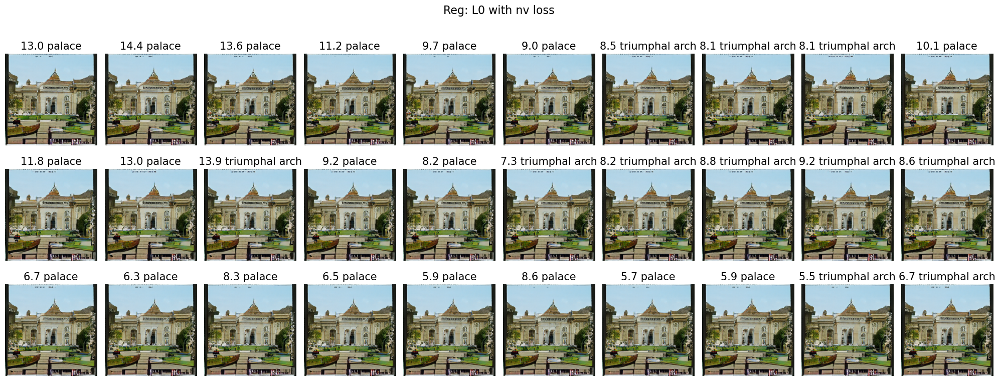

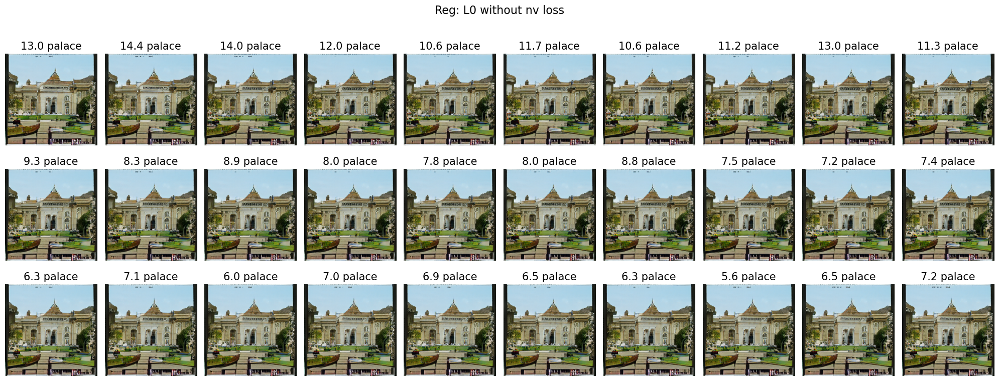

In [120]:
# Train with different regularizations
reg_terms_for_img = ["L0","L2","L_inf"]
noise_v = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()
noise_v_2 = noise_v.clone().detach()
reg_term = reg_terms_for_img[0]
scores_L0, losses_L0, top_cat_L0, top_per_L0 = train_with_regularization(truncation, classes, noise_v=noise_v, reg_type=reg_term, lambda_val=0.0000000015, with_nv_loss=True)

if top_cat_L0[29] != 'palace':
    scores_L0_n, losses_L0_n, top_cat_L0_n, top_per_L0_n = train_with_regularization(truncation, classes, noise_v=noise_v_2, reg_type=reg_term, lambda_val=0.0000000015, with_nv_loss=False)
    obj_class = 'palace'
    images = load_images_from_static_path('L0_Yloss', obj_class)
    plot_images(images, 'Reg: L0 with nv loss', top_per_L0, top_cat_L0)
    images = load_images_from_static_path('L0_Nloss', obj_class)
    plot_images(images, 'Reg: L0 without nv loss', top_per_L0_n, top_cat_L0_n)

# Print or visualize the results
#print("L0 Regularization Results with nv loss:", top_cat_L0)
#print("L0 Regularization Results without nv loss:", top_cat_L0_n)
#print("L2 Regularization Results with nv loss:", top_cat_L2)
#print("L2 Regularization Results without nv loss:", top_cat_L2_n)
#print("L_inf Regularization Results with nv loss:", top_cat_L_inf)
#print("L_inf Regularization Results without nv loss:", top_cat_L_inf_n)

INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_0_0.png


0:  palace: 15.1%   |   palace: 15.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_1_0.png


1:  palace: 20.8%   |   palace: 20.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_2_0.png


2:  church: 17.9%   |   palace: 11.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_3_0.png


3:  palace: 15.9%   |   palace: 15.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_4_0.png


4:  palace: 17.8%   |   palace: 17.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_5_0.png


5:  palace: 14.1%   |   palace: 14.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_6_0.png


6:  palace: 18.2%   |   palace: 18.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_7_0.png


7:  palace: 13.9%   |   palace: 13.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_8_0.png


8:  palace: 11.1%   |   palace: 11.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_9_0.png


9:  palace: 15.5%   |   palace: 15.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_10_0.png


10:  palace: 12.4%   |   palace: 12.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_11_0.png


11:  palace: 17.6%   |   palace: 17.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_12_0.png


12:  palace: 12.4%   |   palace: 12.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_13_0.png


13:  church: 12.2%   |   palace: 9.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_14_0.png


14:  palace: 13.7%   |   palace: 13.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_15_0.png


15:  palace: 12.6%   |   palace: 12.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_16_0.png


16:  palace: 15.0%   |   palace: 15.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_17_0.png


17:  palace: 11.2%   |   palace: 11.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_18_0.png


18:  church: 15.5%   |   palace: 7.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_19_0.png


19:  church: 11.2%   |   palace: 9.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_20_0.png


20:  church: 18.1%   |   palace: 5.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_21_0.png


21:  church: 14.1%   |   palace: 6.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_22_0.png


22:  church: 9.6%   |   palace: 8.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_23_0.png


23:  palace: 11.8%   |   palace: 11.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_24_0.png


24:  church: 10.2%   |   palace: 9.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_25_0.png


25:  palace: 14.6%   |   palace: 14.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_26_0.png


26:  church: 15.7%   |   palace: 8.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_27_0.png


27:  church: 12.6%   |   palace: 10.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_28_0.png


28:  church: 14.1%   |   palace: 11.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Yloss_palace_29_0.png


29:  church: 10.3%   |   palace: 6.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_0_0.png


0:  palace: 15.1%   |   palace: 15.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_1_0.png


1:  palace: 20.8%   |   palace: 20.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_2_0.png


2:  church: 17.9%   |   palace: 11.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_3_0.png


3:  palace: 18.6%   |   palace: 18.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_4_0.png


4:  palace: 15.6%   |   palace: 15.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_5_0.png


5:  church: 14.1%   |   palace: 12.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_6_0.png


6:  palace: 10.9%   |   palace: 10.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_7_0.png


7:  palace: 15.9%   |   palace: 15.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_8_0.png


8:  palace: 11.2%   |   palace: 11.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_9_0.png


9:  church: 9.2%   |   palace: 8.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_10_0.png


10:  church: 12.2%   |   palace: 7.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_11_0.png


11:  church: 13.9%   |   palace: 5.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_12_0.png


12:  church: 11.5%   |   palace: 9.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_13_0.png


13:  church: 14.7%   |   palace: 11.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_14_0.png


14:  dome: 8.8%   |   palace: 8.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_15_0.png


15:  church: 11.4%   |   palace: 9.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_16_0.png


16:  palace: 12.1%   |   palace: 12.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_17_0.png


17:  church: 12.0%   |   palace: 9.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_18_0.png


18:  church: 14.4%   |   palace: 7.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_19_0.png


19:  church: 15.7%   |   palace: 5.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_20_0.png


20:  church: 13.6%   |   palace: 10.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_21_0.png


21:  church: 12.0%   |   palace: 7.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_22_0.png


22:  church: 15.0%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_23_0.png


23:  church: 11.7%   |   palace: 8.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_24_0.png


24:  church: 15.8%   |   palace: 5.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_25_0.png


25:  church: 13.6%   |   palace: 7.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_26_0.png


26:  church: 15.6%   |   palace: 6.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_27_0.png


27:  church: 15.0%   |   palace: 8.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_28_0.png


28:  church: 11.3%   |   palace: 8.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L2_Nloss_palace_29_0.png


29:  palace: 9.4%   |   palace: 9.4%


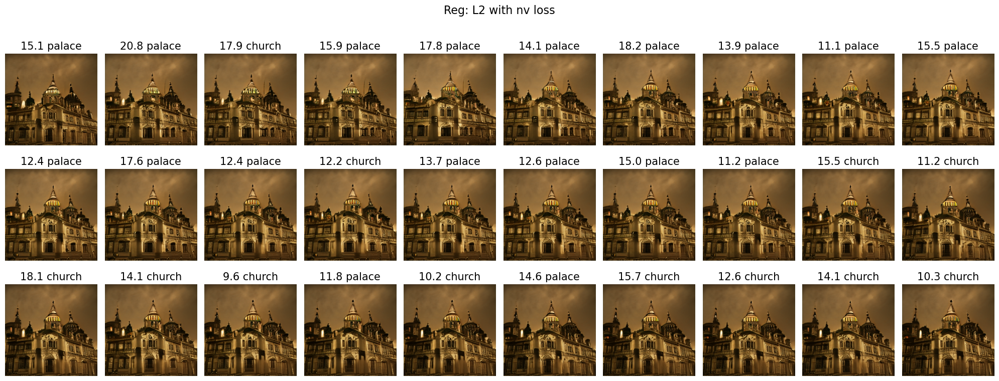

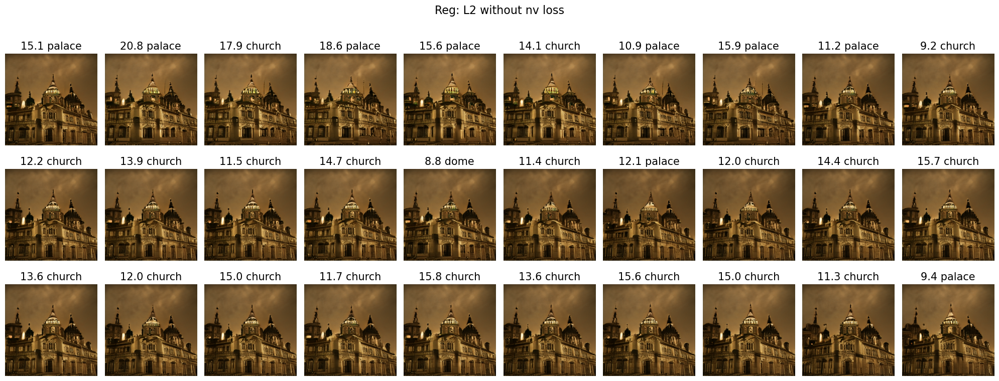

In [67]:
noise_v = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()
noise_v_2 = noise_v.clone().detach()
reg_term = reg_terms_for_img[1]
scores_L2, losses_L2, top_cat_L2, top_per_L2 = train_with_regularization(truncation, classes, noise_v=noise_v, reg_type=reg_term, lambda_val=0.000000005, with_nv_loss=True)
scores_L2_n, losses_L2_n, top_cat_L2_n, top_per_L2_n = train_with_regularization(truncation, classes, noise_v=noise_v_2, reg_type=reg_term, lambda_val=0.000000005, with_nv_loss=False)
images = load_images_from_static_path('L2_Yloss', obj_class)
plot_images(images, 'Reg: L2 with nv loss',top_per_L2, top_cat_L2)
images = load_images_from_static_path('L2_Nloss', obj_class)
plot_images(images, 'Reg: L2 without nv loss', top_per_L2_n, top_cat_L2_n)

INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_0_0.png


0:  palace: 13.9%   |   palace: 13.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_1_0.png


1:  palace: 9.0%   |   palace: 9.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_2_0.png


2:  palace: 12.8%   |   palace: 12.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_3_0.png


3:  palace: 6.3%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_4_0.png


4:  monastery: 9.1%   |   palace: 6.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_5_0.png


5:  church: 9.5%   |   palace: 6.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_6_0.png


6:  monastery: 10.0%   |   palace: 6.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_7_0.png


7:  church: 9.2%   |   palace: 5.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_8_0.png


8:  church: 8.9%   |   palace: 4.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_9_0.png


9:  monastery: 9.5%   |   palace: 2.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_10_0.png


10:  monastery: 9.5%   |   palace: 2.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_11_0.png


11:  monastery: 10.0%   |   palace: 2.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_12_0.png


12:  church: 7.9%   |   palace: 2.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_13_0.png


13:  church: 7.8%   |   palace: 2.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_14_0.png


14:  monastery: 7.9%   |   palace: 2.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_15_0.png


15:  monastery: 9.1%   |   palace: 2.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_16_0.png


16:  monastery: 9.3%   |   palace: 2.1%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_17_0.png


17:  monastery: 9.3%   |   palace: 2.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_18_0.png


18:  monastery: 9.8%   |   palace: 2.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_19_0.png


19:  monastery: 10.1%   |   palace: 1.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_20_0.png


20:  monastery: 10.7%   |   palace: 1.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_21_0.png


21:  monastery: 9.9%   |   palace: 1.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_22_0.png


22:  monastery: 9.3%   |   palace: 1.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_23_0.png


23:  monastery: 12.5%   |   palace: 1.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_24_0.png


24:  monastery: 10.6%   |   palace: 1.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_25_0.png


25:  monastery: 10.8%   |   palace: 1.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_26_0.png


26:  monastery: 8.2%   |   palace: 2.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_27_0.png


27:  monastery: 8.8%   |   palace: 1.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_28_0.png


28:  monastery: 8.7%   |   palace: 2.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Yloss_palace_29_0.png


29:  monastery: 7.7%   |   palace: 1.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_0_0.png


0:  palace: 13.9%   |   palace: 13.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_1_0.png


1:  palace: 9.0%   |   palace: 9.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_2_0.png


2:  palace: 12.5%   |   palace: 12.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_3_0.png


3:  palace: 6.5%   |   palace: 6.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_4_0.png


4:  church: 7.0%   |   palace: 5.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_5_0.png


5:  palace: 9.3%   |   palace: 9.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_6_0.png


6:  palace: 9.6%   |   palace: 9.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_7_0.png


7:  palace: 7.4%   |   palace: 7.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_8_0.png


8:  church: 8.1%   |   palace: 5.5%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_9_0.png


9:  church: 9.9%   |   palace: 9.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_10_0.png


10:  church: 11.7%   |   palace: 4.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_11_0.png


11:  church: 8.8%   |   palace: 5.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_12_0.png


12:  church: 9.5%   |   palace: 7.4%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_13_0.png


13:  church: 8.5%   |   palace: 6.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_14_0.png


14:  church: 9.4%   |   palace: 7.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_15_0.png


15:  palace: 9.2%   |   palace: 9.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_16_0.png


16:  palace: 12.0%   |   palace: 12.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_17_0.png


17:  palace: 8.3%   |   palace: 8.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_18_0.png


18:  palace: 6.6%   |   palace: 6.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_19_0.png


19:  palace: 6.9%   |   palace: 6.9%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_20_0.png


20:  palace: 7.0%   |   palace: 7.0%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_21_0.png


21:  palace: 9.3%   |   palace: 9.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_22_0.png


22:  palace: 8.8%   |   palace: 8.8%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_23_0.png


23:  palace: 14.6%   |   palace: 14.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_24_0.png


24:  monastery: 9.5%   |   palace: 5.7%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_25_0.png


25:  church: 11.4%   |   palace: 6.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_26_0.png


26:  church: 8.6%   |   palace: 5.3%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_27_0.png


27:  palace: 7.6%   |   palace: 7.6%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_28_0.png


28:  palace: 7.2%   |   palace: 7.2%


INFO:pytorch_pretrained_biggan.utils:Saving image to output_L_inf_Nloss_palace_29_0.png


29:  palace: 8.0%   |   palace: 8.0%


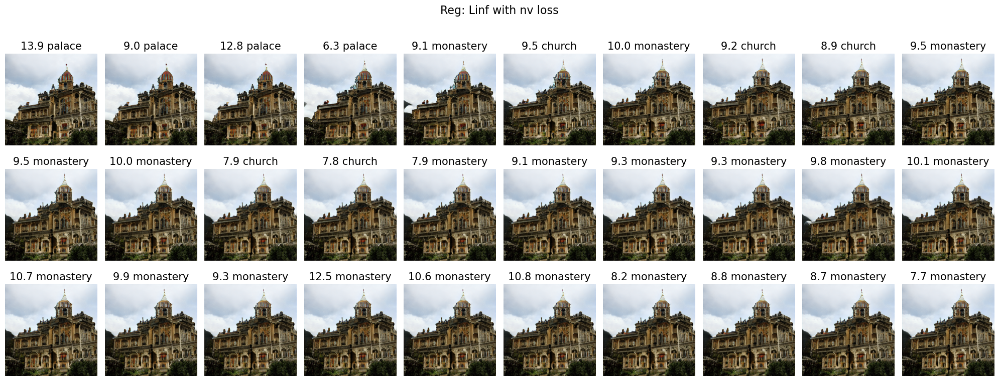

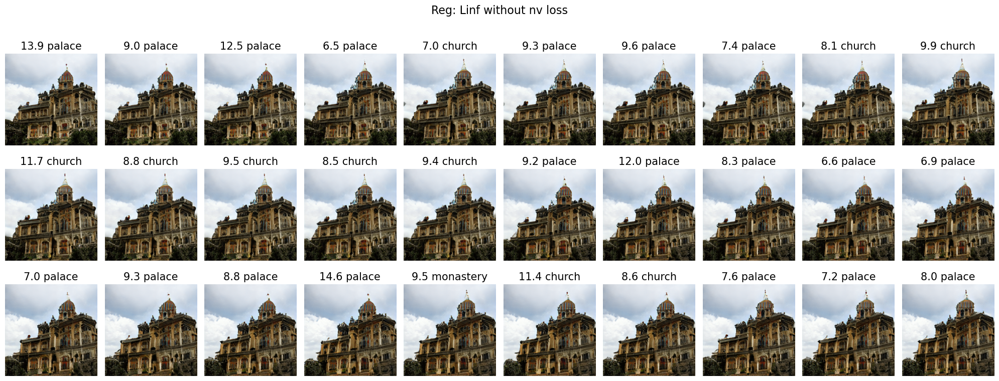

In [81]:
noise_v = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()
noise_v_2 = noise_v.clone().detach()
reg_term = reg_terms_for_img[2]
scores_L_inf, losses_L_inf, top_cat_L_inf, top_per_L_inf = train_with_regularization(truncation, classes, noise_v=noise_v, reg_type=reg_term, lambda_val=0.00000005, with_nv_loss=True)
scores_L_inf_n, losses_L_inf_n, top_cat_L_inf_n, top_per_L_inf_n = train_with_regularization(truncation, classes, noise_v=noise_v_2, reg_type=reg_term, lambda_val=0.00000005, with_nv_loss=False)
images = load_images_from_static_path('L_inf_Yloss', obj_class)
plot_images(images, 'Reg: Linf with nv loss', top_per_L_inf, top_cat_L_inf)
images = load_images_from_static_path('L_inf_Nloss', obj_class)
plot_images(images, 'Reg: Linf without nv loss', top_per_L_inf_n, top_cat_L_inf_n)

In [ ]:
### Display GAN Outputs After Each Step ###
#import matplotlib.image as img
#import matplotlib.pyplot as img
for l in reg_terms_for_img:
    for i in range(0,ITERATIONS,10):
      image = plt.image.imread("./output_"+l+str(i)+"_0.png")
      #plt.pyplot.subplot(5,20,i+1)
      plt.pyplot.imshow(image)
      plt.pyplot.xticks([])
      plt.pyplot.yticks([])
      plt.pyplot.show()

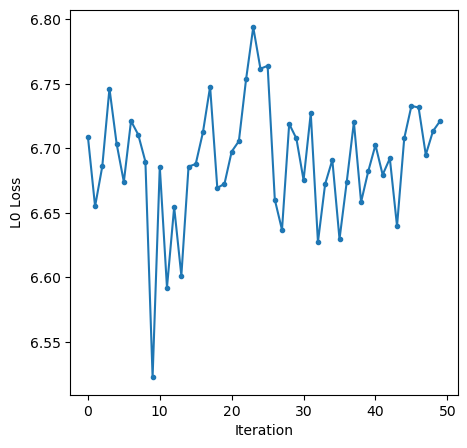

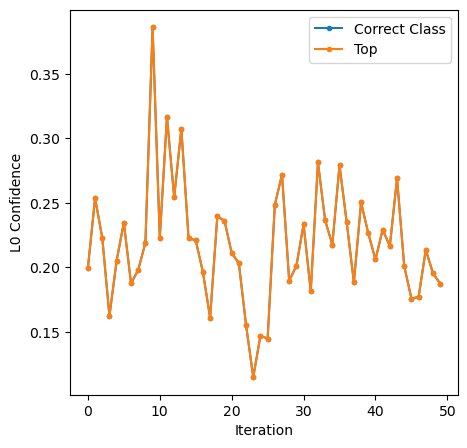

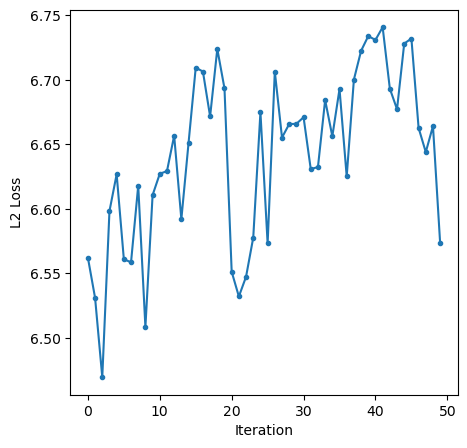

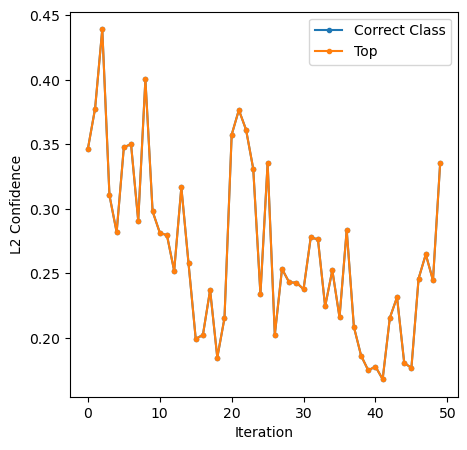

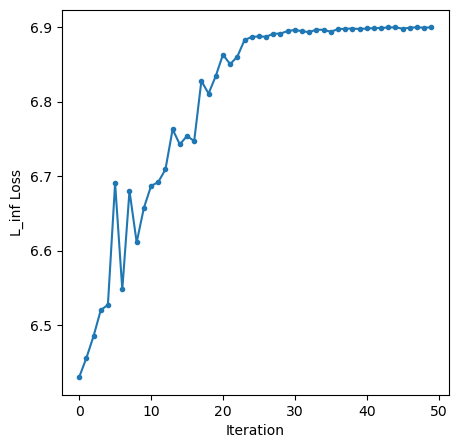

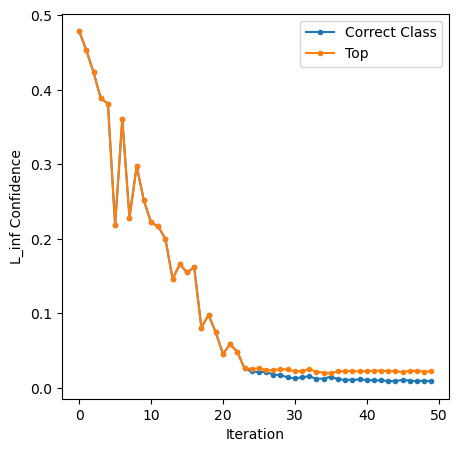

In [88]:
def print_graphs(scores, losses, top_per, reg_name):
    fig, ax = plt.pyplot.subplots(figsize=(5, 5))
    ax.plot(losses, '.-')
    plt.pyplot.xlabel('Iteration')
    plt.pyplot.ylabel(reg_name + ' Loss')
    plt.pyplot.show()

    fig, ax = plt.pyplot.subplots(figsize=(5, 5))
    ax.plot(scores, '.-')
    ax.plot(top_per, ".-")
    plt.pyplot.xlabel('Iteration')
    plt.pyplot.ylabel(reg_name + ' Confidence')
    #ax.axvspan(0, 27.5, color="green", alpha=0.3)
    #ax.axvspan(7.5, 8.5, color="green", alpha=0.3)
    #ax.axvspan(5.5, 7.5, color="red", alpha=0.3)
    #ax.axvspan(8.5, 19.5, color="red", alpha=0.3)
    #ax.axvspan(19.5, 23.5, color="blue", alpha=0.3)
    #ax.axvspan(23.5, 24.5, color="purple", alpha=0.3)
    plt.pyplot.legend(["Correct Class", "Top"])
    plt.pyplot.show()

print_graphs(scores_L0, losses_L0, top_per_L0, reg_terms_for_img[0])
print_graphs(scores_L2, losses_L2, top_per_L2, reg_terms_for_img[1])
print_graphs(scores_L_inf, losses_L_inf, top_per_L_inf, reg_terms_for_img[2])

In [89]:
#explaination for L_inf confidence graph:
print(np.array(scores_L_inf)-(np.array(top_per_L_inf)))
#Seems like more than a few iterations are required

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]


In [ ]:
### Run Gradient Ascent (Multiple Iterations)###
def train():
    prediction, score = predict(model, noise_vector, class_vector, truncation, classes, i, save=False)
    output = -1*loss(prediction, class_vector.squeeze(0))
    #output = loss(prediction, eq)
    #output = loss(prediction, tar) -1*loss(prediction, class_vector.squeeze(0))
    output.backward()
    optimizer.zero_grad
    optimizer.step()

    scores[j,i] = score
    losses[j,i] = -1*output.item()
    top_cat[j,i] = torch.argmax(prediction)
    top_per[j,i] = prediction.max().item()


n = 50
iters = 50

scores = torch.zeros([n,iters])
losses = torch.zeros([n,iters])
top_cat = torch.zeros([n,iters])
top_per = torch.zeros([n,iters])

for j in range(n):
    print("------------ Iteration",j,"------------")
    noise_vector = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()
    optimizer = torch.optim.SGD([noise_vector], lr=0.01)
    loss = nn.CrossEntropyLoss()

    for i in range(25):
        train()

    if top_cat[j,24]== 721:
        for i in range(25,50):
            train()
    else:
        losses[j,25:50] = losses[j,24]
        scores[j,25:50] = scores[j,24]
        top_per[j,25:50] = top_per[j,24]
        top_cat[j,25:50] = top_cat[j,24]

In [ ]:
fig, ax = plt.pyplot.subplots(figsize=(5, 5))
ax.plot(losses.mean(dim=0), '.-')
plt.pyplot.xlabel('Iteration')
plt.pyplot.ylabel('Loss')
plt.pyplot.show()

fig, ax = plt.pyplot.subplots(figsize=(5, 5))
ax.plot(scores.mean(dim=0), '.-')
ax.plot(top_per.mean(dim=0), ".-")
plt.pyplot.xlabel('Iteration')
plt.pyplot.ylabel('Confidence')
#ax.axvspan(0, 27.5, color="green", alpha=0.3)
#ax.axvspan(7.5, 8.5, color="green", alpha=0.3)
#ax.axvspan(5.5, 7.5, color="red", alpha=0.3)
#ax.axvspan(8.5, 19.5, color="red", alpha=0.3)
#ax.axvspan(19.5, 23.5, color="blue", alpha=0.3)
#ax.axvspan(23.5, 24.5, color="purple", alpha=0.3)
plt.pyplot.legend(["Correct Class", "Top"])
plt.pyplot.show()

In [ ]:
### Get classifier accuracy on GAN outputs ###
from tqdm import tqdm

model = MyEnsemble(GAN_model, classifier, preprocess)
truncation = 0.5
class_vector = torch.zeros([1,1000])
count=0

for i in tqdm(range(1000)):
  class_vector[0,i] = 1
  noise_vector = torch.from_numpy(truncated_noise_sample(truncation=truncation, batch_size=1)).requires_grad_()

  prediction = model(noise_vector, class_vector, truncation, save=False)
  predicted_class = prediction.argmax().item()
  if(i!=predicted_class):
    count += 1
    real_class = weights.meta["categories"][i]
    predict(model, noise_vector, class_vector, truncation, real_class, (i,count))

  class_vector[0,i] = 0